In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import folium

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore")

In [2]:
df1 = pd.read_csv("/content/train_part1.csv")
df2 = pd.read_csv("/content/train_part2.csv")

print("Dataset 1 Shape :", df1.shape)
print("Dataset 2 Shape :", df2.shape)

print("\nDataset 1 Columns")
print(df1.columns)

print("\nDataset 2 Columns")
print(df2.columns)

Dataset 1 Shape : (2364, 24)
Dataset 2 Shape : (2364, 24)

Dataset 1 Columns
Index(['ListingID', 'City', 'Locality', 'PropertyType', 'BHK', 'Bathrooms',
       'Balconies', 'Furnishing', 'SuperBuiltUpArea_sqft', 'BuiltUpArea_sqft',
       'CarpetArea_sqft', 'Floor', 'TotalFloors', 'Parking', 'BuildingType',
       'YearBuilt', 'AgeYears', 'Facing', 'AmenitiesCount', 'IsRERARegistered',
       'RERAID', 'Latitude', 'Longitude', 'Price_INR'],
      dtype='object')

Dataset 2 Columns
Index(['ListingID', 'City', 'Locality', 'PropertyType', 'BHK', 'Bathrooms',
       'Balconies', 'Furnishing', 'SuperBuiltUpArea_sqft', 'BuiltUpArea_sqft',
       'CarpetArea_sqft', 'Floor', 'TotalFloors', 'Parking', 'BuildingType',
       'YearBuilt', 'AgeYears', 'Facing', 'AmenitiesCount', 'IsRERARegistered',
       'RERAID', 'Latitude', 'Longitude', 'Price_INR'],
      dtype='object')


In [5]:
print("\nDataset 1")
print(df1.head())

print("\nDataset 2")
print(df2.head())

data = pd.concat([df1, df2], ignore_index=True)

print("\nMerged Dataset Shape :", data.shape)


Dataset 1
  ListingID       City       Locality PropertyType  BHK  Bathrooms  Balconies  \
0   HP01139  Bengaluru            NaN        Villa    3        3.0        2.0   
1   HP01630    Kolkata       Rajarhat    Apartment    1        2.0        1.0   
2   HP01608    Kolkata      Salt Lake    Apartment    1        2.0        3.0   
3   HP01979        MMR  Goregaon East    Apartment    2        3.0        NaN   
4   HP01399  Hyderabad       Madhapur    Apartment    3        4.0        1.0   

       Furnishing  SuperBuiltUpArea_sqft  BuiltUpArea_sqft  ...  \
0  Semi-Furnished                   1576              1299  ...   
1     Unfurnished                   1098               870  ...   
2     Unfurnished                    863               710  ...   
3       Furnished                   1135               952  ...   
4  Semi-Furnished                   2662              2176  ...   

          BuildingType  YearBuilt  AgeYears      Facing AmenitiesCount  \
0             Bungalow   

In [7]:
print("\nMissing Values")
print(data.isnull().sum())

data.drop_duplicates(inplace=True)

print("\nShape After Removing Duplicates")
print(data.shape)

df1.info()
df2.info()


Missing Values
ListingID                  0
City                      50
Locality                  70
PropertyType               0
BHK                        0
Bathrooms                 54
Balconies                100
Furnishing                83
SuperBuiltUpArea_sqft      0
BuiltUpArea_sqft           0
CarpetArea_sqft            0
Floor                      0
TotalFloors                0
Parking                  440
BuildingType               0
YearBuilt                 39
AgeYears                   0
Facing                   108
AmenitiesCount             0
IsRERARegistered           0
RERAID                   950
Latitude                  50
Longitude                 59
Price_INR                  0
dtype: int64

Shape After Removing Duplicates
(4728, 24)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2364 entries, 0 to 2363
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ListingID      

In [8]:
required_columns = ["Latitude","Longitude","Price_INR","Locality",
"SuperBuiltUpArea_sqft"]

data = data[required_columns]

data = data.dropna()

print("\nFinal Dataset Shape")
print(data.shape)


Final Dataset Shape
(4550, 5)


In [9]:
data["Latitude"] = pd.to_numeric(data["Latitude"])
data["Longitude"] = pd.to_numeric(data["Longitude"])
data["Price_INR"] = pd.to_numeric(data["Price_INR"])
data["SuperBuiltUpArea_sqft"] = pd.to_numeric(
    data["SuperBuiltUpArea_sqft"]
)

print("\nDataset Information")
print(data.info())

print("\nStatistical Summary")
print(data.describe())

print("\nMissing Values After Cleaning")
print(data.isnull().sum())

data.to_csv("Cleaned_Dataset.csv", index=False)

print("\nCleaned Dataset Saved Successfully.")


Dataset Information
<class 'pandas.core.frame.DataFrame'>
Index: 4550 entries, 1 to 4727
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Latitude               4550 non-null   float64
 1   Longitude              4550 non-null   float64
 2   Price_INR              4550 non-null   int64  
 3   Locality               4550 non-null   object 
 4   SuperBuiltUpArea_sqft  4550 non-null   int64  
dtypes: float64(2), int64(2), object(1)
memory usage: 213.3+ KB
None

Statistical Summary
          Latitude    Longitude     Price_INR  SuperBuiltUpArea_sqft
count  4550.000000  4550.000000  4.550000e+03            4550.000000
mean     19.361757    77.550052  1.851256e+07            1976.055824
std       4.966262     4.717279  1.278348e+07            1043.015727
min      12.800641    72.400121  2.000000e+06             406.000000
25%      13.186298    73.752646  1.006000e+07            1237.000000
50%      1

In [10]:
features = data[["Latitude","Longitude","Price_INR","SuperBuiltUpArea_sqft"]]

print("\nSelected Features")
print(features.head())

scaler = StandardScaler()

scaled_features = scaler.fit_transform(features)

scaled_df = pd.DataFrame(
    scaled_features,
    columns=features.columns
)

print("\nScaled Data")
print(scaled_df.head())


Selected Features
    Latitude  Longitude  Price_INR  SuperBuiltUpArea_sqft
1  22.584035  88.440364    7130000                   1098
2  22.535687  88.416707    5920000                    863
4  17.444963  78.431430   20300000                   2662
5  23.063364  72.593854    9230000                   1814
6  12.948053  77.785061   14890000                   1722

Scaled Data
   Latitude  Longitude  Price_INR  SuperBuiltUpArea_sqft
0  0.648905   2.308854  -0.890510              -0.841936
1  0.639169   2.303839  -0.985174              -1.067269
2 -0.386006   0.186861   0.139839               0.657727
3  0.745433  -1.050763  -0.726217              -0.155389
4 -1.291597   0.049824  -0.283410              -0.243605


In [11]:
wcss = []

for i in range(1, 11):

    model = KMeans(
        n_clusters=i,
        init='k-means++',
        random_state=42,
    )

    model.fit(scaled_df)

    wcss.append(model.inertia_)

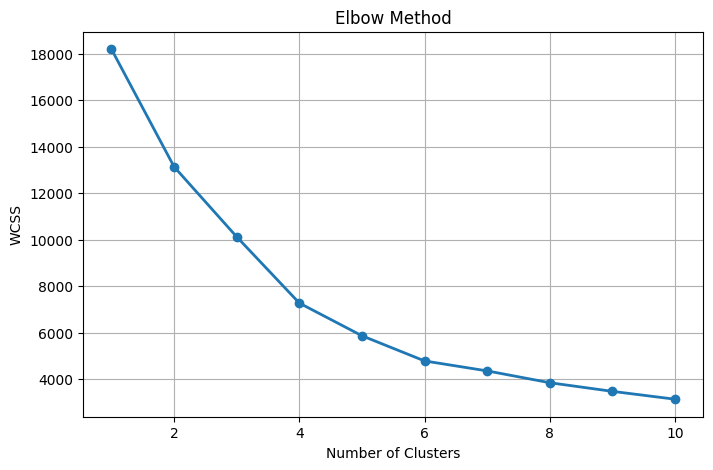

In [12]:
plt.figure(figsize=(8,5))

plt.plot(
    range(1,11),
    wcss,
    marker='o',
    linewidth=2
)

plt.title("Elbow Method")

plt.xlabel("Number of Clusters")

plt.ylabel("WCSS")

plt.grid(True)

plt.savefig("Elbow_Method.png")

plt.show()

In [13]:
k = 4

print("\nOptimal Number of Clusters =", k)

kmeans = KMeans(
    n_clusters=k,
    init='k-means++',
    random_state=42,
)

clusters = kmeans.fit_predict(scaled_df)

data["Cluster"] = clusters

print("\nCluster Count")

print(data["Cluster"].value_counts())


Optimal Number of Clusters = 4

Cluster Count
Cluster
3    2228
1    1069
2     742
0     511
Name: count, dtype: int64


In [14]:
print("\nCluster Centers")

centers = scaler.inverse_transform(kmeans.cluster_centers_)

centers = pd.DataFrame(
    centers,
    columns=["Latitude","Longitude","Price_INR","SuperBuiltUpArea_sqft"]
)

print(centers)

data.to_csv(
    "Clustered_House_Data.csv",
    index=False
)

print("\nClustered Dataset Saved Successfully.")


Cluster Centers
    Latitude  Longitude     Price_INR  SuperBuiltUpArea_sqft
0  22.552890  88.399538  1.464405e+07            1858.195695
1  25.799582  74.884947  1.262344e+07            1748.100094
2  18.061778  75.878037  3.997073e+07            3573.109164
3  15.973911  76.897245  1.507914e+07            1580.587971

Clustered Dataset Saved Successfully.


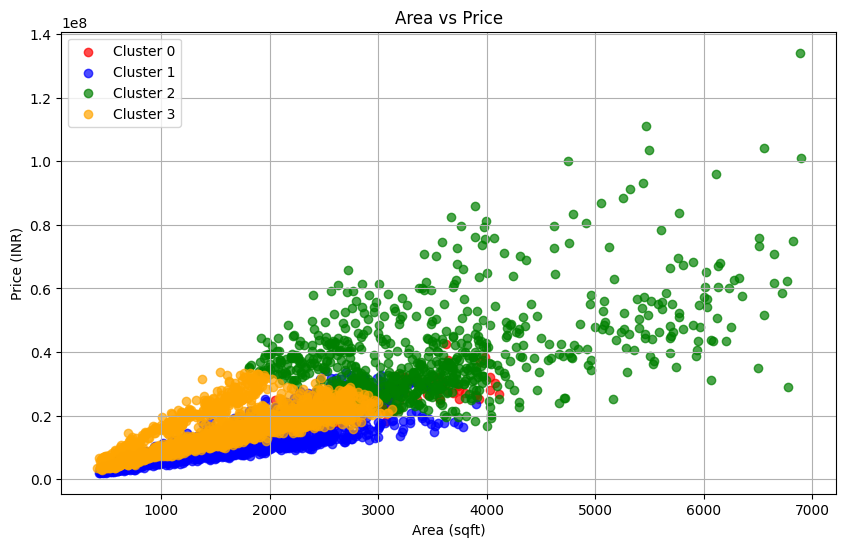

In [15]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,6))

colors = ["red","blue","green","orange"]

for i in range(k):

    cluster = data[data["Cluster"] == i]

    plt.scatter(
        cluster["SuperBuiltUpArea_sqft"],
        cluster["Price_INR"],
        color=colors[i],
        label="Cluster "+str(i),
        alpha=0.7
    )

plt.title("Area vs Price")

plt.xlabel("Area (sqft)")

plt.ylabel("Price (INR)")

plt.legend()

plt.grid(True)

plt.savefig("Area_vs_Price.png")

plt.show()

In [20]:
Classic = data["Price_INR"].quantile(0.33)
Affordable = data["Price_INR"].quantile(0.66)

def property_level(price):

    if price <= Classic:
        return "Classic"

    elif price <= Affordable:
        return "Affordable"

    else:
        return "Luxury"

data["Property_Level"] = data["Price_INR"].apply(property_level)

print(data[
    [
        "Price_INR",
        "Property_Level"
    ]
].head())

   Price_INR Property_Level
1    7130000        Classic
2    5920000        Classic
4   20300000         Luxury
5    9230000        Classic
6   14890000     Affordable


In [22]:
import folium
from folium.plugins import MarkerCluster

center_lat = data["Latitude"].mean()
center_lon = data["Longitude"].mean()

real_map = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=11,
    tiles="OpenStreetMap"
)

marker_cluster = MarkerCluster().add_to(real_map)

for index, row in data.iterrows():

    if row["Property_Level"] == "Luxury":
        color = "red"

    elif row["Property_Level"] == "Affordable":
        color = "blue"

    else:
        color = "green"

    popup = f"""
    <b>Location :</b> {row['Locality']}<br>

    <b>Price :</b> ₹ {row['Price_INR']:,}<br>

    <b>Area :</b> {row['SuperBuiltUpArea_sqft']} Sq.ft<br>

    <b>Property :</b> {row['Property_Level']}<br>
    """

    icon = folium.Icon(
        color=color,
        icon="home",
        prefix="fa"
    )

    folium.Marker(
        location=[
            row["Latitude"],
            row["Longitude"]
        ],
        popup=folium.Popup(popup, max_width=300),
        icon=icon
    ).add_to(marker_cluster)

display(real_map)